## transformadas imagem

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from fastai.gen_doc.nbdoc import *
from fastai.vision import * 

fastai fornece uma biblioteca de transformação de imagem completo escrito a partir do zero em PyTorch. Embora o objetivo principal da biblioteca é de aumento de dados para uso ao treinar modelos de visão por computador, você também pode usá-lo para fins de transformação mais imagem geral. Antes de entrar para o detalhe da API completo, vamos olhar para uma rápida visão geral das peças de aumento de dados que você quase certamente precisa usar.

## crescimento de dados

o aumento de dados é talvez a técnica de regularização mais importante ao treinar um modelo de Visão Computacional: em vez de alimentar o modelo com as mesmas imagens de cada vez, fazemos pequenas transformações aleatórias (um pouco de rotação, zoom, tradução, etc ...) que não mudar o que está dentro da imagem (ao olho humano), mas não alterar seus valores de pixel. Modelos treinados com o aumento de dados, então, generalizar melhor.
Para obter um conjunto de transformações com valores padrão que trabalham muito bem em uma ampla gama de tarefas, muitas vezes é mais fácil de usar [`get_transforms`](/vision.transform.html#get_transforms). Dependendo da natureza das imagens em seus dados, você pode querer ajustar alguns argumentos, sendo as mais importantes:
- `do_flip`: se verdadeira a imagem é invertida de forma aleatória (comportamento padrão)
- `flip_vert`: limitar as aletas para aletas horizontais (quando falso) ou para a posição horizontal e vertical aletas, bem como 90 graus rotações (quando verdadeiro)
[`get_transforms`](/vision.transform.html#get_transforms) retorna uma tupla de duas listas de transformações: uma para o conjunto de treinamento e um para o conjunto de validação (nós não queremos para modificar as imagens no conjunto de validação, então a segunda lista de transformações é limitado a redimensionar as fotos). Isto pode ser passado diretamente para definir um objeto [`DataBunch`](/basic_data.html#DataBunch) (veja abaixo) que é então associado a um modelo para começar a treinar.
Note-se que os padrões para [`get_transforms`](/vision.transform.html#get_transforms) são geralmente muito bom para fotos regulares - embora aqui vamos adicionar um pouco de rotação extra assim é mais fácil ver as diferenças.

In [ ]:
tfms = get_transforms(max_rotate=25)
len(tfms)

2

Nós primeiro definir uma função para retornar uma nova imagem, desde funções de transformação modificar suas entradas. Nós também definir um pequeno ajudante função `plots_f` para nos deixar de saída uma grade de imagens transformadas com base em uma função - os detalhes desta função não são importantes aqui.

In [ ]:
def get_ex(): return open_image('imgs/cat_example.jpg')

def plots_f(rows, cols, width, height, **kwargs):
    [get_ex().apply_tfms(tfms[0], **kwargs).show(ax=ax) for i,ax in enumerate(plt.subplots(
        rows,cols,figsize=(width,height))[1].flatten())]

Se queremos ter um olhar para o que essas transformações realmente fazer, precisamos usar a função [`apply_tfms`](/vision.image.html#Image.apply_tfms). Ele será encarregado de escolher os valores dos parâmetros aleatórios e fazer as transformações para o objeto [`Image`](/vision.image.html#Image). Esta função tem vários argumentos que você pode personalizar (veja a sua documentação para obter mais detalhes); aqui vamos destacar o mais útil. O primeiro que vamos precisar para definir, especialmente se as nossas imagens são de diferentes formas, é o size` alvo `. Ele irá garantir que todas as imagens são cortadas ou preenchido para o mesmo tamanho para que possamos, em seguida, reunir-las em lotes.

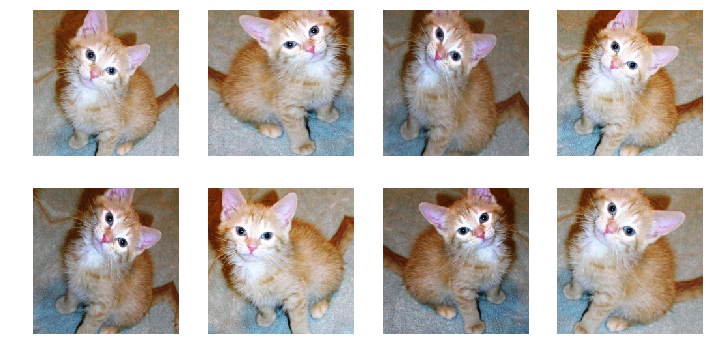

In [ ]:
plots_f(2, 4, 12, 6, size=224)

Note-se que o alvo `size` pode ser um retângulo se você especificar uma tupla de int.

In [ ]:
jekyll_note("""In fastai we follow the convention of numpy and pytorch for image dimensions: (height, width). It's different
            from PIL or matplolib so don't get confused.""")

<div markdown="span" class="alert alert-info" role="alert"><i class="fa fa-info-circle"></i> <b>Note: </b>In fastai we follow the convention of numpy and pytorch for image dimensions: (height, width). It's different
            from PIL or matplolib so don't get confused.</div>

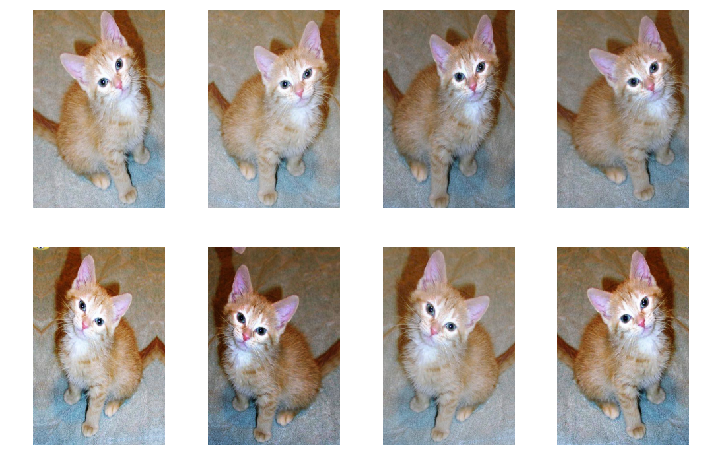

In [ ]:
plots_f(2, 4, 12, 8, size=(300,200))

O segundo argumento que pode ser personalizado é como tratamos pixels em falta: ao aplicar transformações (como uma rotação), alguns dos pixels dentro da praça não terão valores a partir da imagem. Podemos definir pixels faltando para um dos seguintes procedimentos:
- preto ( `padding_mode` = 'zeros')
- o valor do pixel na fronteira mais próxima ( `padding_mode` = 'border')
- o valor da simétrica pixel para a fronteira mais próxima ( `padding_mode` = 'reflexão')
`Padding_mode` = 'reflexo' é o padrão. Aqui está o que `padding_mode` = 'zeros' se parece com:

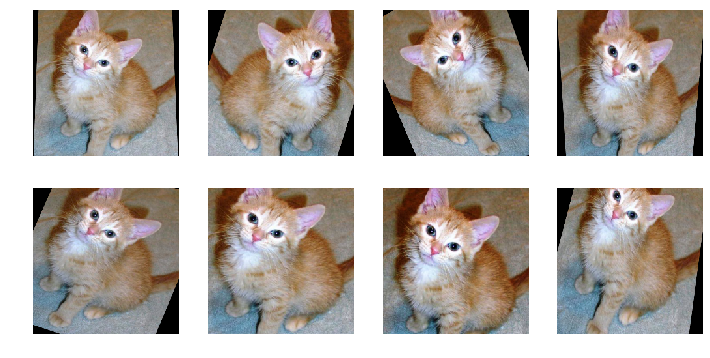

In [ ]:
plots_f(2, 4, 12, 6, size=224, padding_mode='zeros')

E `padding_mode` = 'border' se parece com isso:

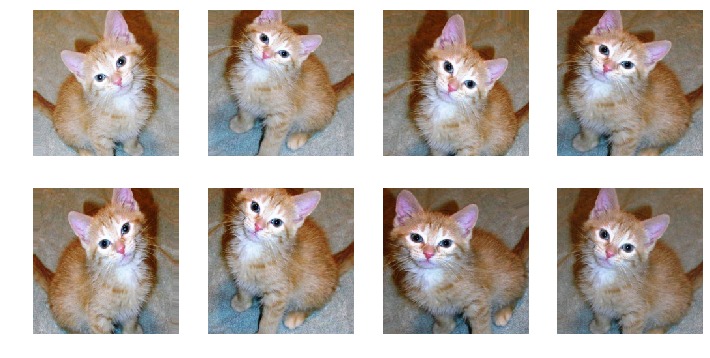

In [ ]:
plots_f(2, 4, 12, 6, size=224, padding_mode='border')

O terceiro argumento que possa ser útil para a mudança é [`resize_method`](vision.image.html#ResizeMethod). As imagens são geralmente retângulos de diferentes proporções, de modo a levá-los para o size` alvo `, nós pode precisar de cortar, esmagar, ou pad-los para obter o direito ratio.
Por padrão, a biblioteca redimensiona a imagem, mantendo a sua relação original para que o menor tamanho corresponde ao tamanho dado, então toma uma colheita (<code> ResizeMethod.CROP </ code>). Você pode escolher para redimensionar a imagem, mantendo a sua relação original para que o maior tamanho corresponde ao tamanho dado, em seguida, tomar uma almofada (<code> ResizeMethod.PAD </ code>). Outra maneira é apenas esmagar a imagem para o tamanho determinado (<code> ResizeMethod.SQUISH </ code>).

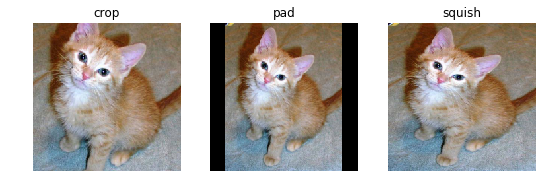

In [ ]:
_,axs = plt.subplots(1,3,figsize=(9,3))
for rsz,ax in zip([ResizeMethod.CROP, ResizeMethod.PAD, ResizeMethod.SQUISH], axs):
    get_ex().apply_tfms([crop_pad()], size=224, resize_method=rsz, padding_mode='zeros').show(ax=ax, title=rsz.name.lower())

## detalhes de aumento de dados

Se você deseja obter rapidamente um conjunto de transformações aleatórias que têm funcionado bem em uma ampla gama de tarefas, você deve usar a função [`get_transforms`](/vision.transform.html#get_transforms). Os parâmetros mais importantes para ajustar são * fazer \ _flip * e * aleta \ _vert *, dependendo do tipo de imagens que você tem.

In [ ]:
show_doc(get_transforms,  arg_comments={
    'do_flip': 'if True, a random flip is applied with probability 0.5',
    'flip_vert': 'requires do_flip=True. If True, the image can be flipped vertically or rotated by 90 degrees, otherwise only an horizontal flip is applied',
    'max_rotate': 'if not None, a random rotation between -max\_rotate and max\_rotate degrees is applied with probability p\_affine',
    'max_zoom': 'if not 1. or less, a random zoom betweem 1. and max\_zoom is applied with probability p\_affine',
    'max_lighting': 'if not None, a random lightning and contrast change controlled by max\_lighting is applied with probability p\_lighting',
    'max_warp': 'if not None, a random symmetric warp of magnitude between -max\_warp and maw\_warp is applied with probability p\_affine',    
    'p_affine': 'the probability that each affine transform and symmetric warp is applied',
    'p_lighting': 'the probability that each lighting transform is applied',
    'xtra_tfms': 'a list of additional transforms you would like to be applied'
})

<h4 id="get_transforms" class="doc_header"><code>get_transforms</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L308" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#get_transforms-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>get_transforms</code>(**`do_flip`**:`bool`=***`True`***, **`flip_vert`**:`bool`=***`False`***, **`max_rotate`**:`float`=***`10.0`***, **`max_zoom`**:`float`=***`1.1`***, **`max_lighting`**:`float`=***`0.2`***, **`max_warp`**:`float`=***`0.2`***, **`p_affine`**:`float`=***`0.75`***, **`p_lighting`**:`float`=***`0.75`***, **`xtra_tfms`**:`Optional`\[`Collection`\[[`Transform`](/vision.image.html#Transform)\]\]=***`None`***) → `Collection`\[[`Transform`](/vision.image.html#Transform)\]

<div class="collapse" id="get_transforms-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#get_transforms-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>Tests found for <code>get_transforms</code>:</p><ul><li><code>pytest -sv tests/test_vision_data.py::test_image_to_image_different_tfms</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_data.py#L328" class="source_link" style="float:right">[source]</a></li><li><code>pytest -sv tests/test_vision_data.py::test_image_to_image_different_y_size</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_data.py#L313" class="source_link" style="float:right">[source]</a></li></ul><p>Some other tests where <code>get_transforms</code> is used:</p><ul><li><code>pytest -sv tests/test_vision_transform.py::test_crop_without_size</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L123" class="source_link" style="float:right">[source]</a></li></ul><p>To run tests please refer to this <a href="/dev/test.html#quick-guide">guide</a>.</p></div></div>

Utility func to easily create a list of flip, rotate, [`zoom`](/vision.transform.html#_zoom), warp, lighting transforms. 

- *do_flip*: if True, a random flip is applied with probability 0.5
- *flip_vert*: requires do_flip=True. If True, the image can be flipped vertically or rotated by 90 degrees, otherwise only an horizontal flip is applied
- *max_rotate*: if not None, a random rotation between -max\_rotate and max\_rotate degrees is applied with probability p\_affine
- *max_zoom*: if not 1. or less, a random zoom betweem 1. and max\_zoom is applied with probability p\_affine
- *max_lighting*: if not None, a random lightning and contrast change controlled by max\_lighting is applied with probability p\_lighting
- *max_warp*: if not None, a random symmetric warp of magnitude between -max\_warp and maw\_warp is applied with probability p\_affine
- *p_affine*: the probability that each affine transform and symmetric warp is applied
- *p_lighting*: the probability that each lighting transform is applied
- *xtra_tfms*: a list of additional transforms you would like to be applied 

Esta função retorna uma tupla de duas listas de transformações, uma para o conjunto de treinamento e outro para o conjunto de validação (que se limita a uma cultura centro por padrão).

In [ ]:
tfms = get_transforms(max_rotate=25); len(tfms)

2

Vamos ver como [`get_transforms`](/vision.transform.html#get_transforms) muda este pequeno gatinho agora.

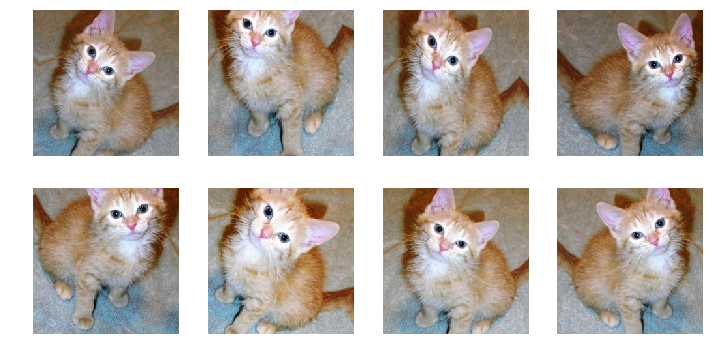

In [ ]:
plots_f(2, 4, 12, 6, size=224)

Outra função útil que dá transforma básicos é [`zoom_crop`](/vision.transform.html#zoom_crop):

In [ ]:
show_doc(zoom_crop, arg_comments={
    'scale': 'Decimal or range of decimals to zoom the image',
    'do_rand': "If true, transform is randomized, otherwise it's a `zoom` of `scale` and a center crop",
    'p': 'Probability to apply the zoom'
})

<h4 id="zoom_crop" class="doc_header"><code>zoom_crop</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L226" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#zoom_crop-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>zoom_crop</code>(**`scale`**:`float`, **`do_rand`**:`bool`=***`False`***, **`p`**:`float`=***`1.0`***)

<div class="collapse" id="zoom_crop-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#zoom_crop-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>zoom_crop</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

Randomly zoom and/or crop. 

- *scale*: Decimal or range of decimals to zoom the image
- *do_rand*: If true, transform is randomized, otherwise it's a `zoom` of `scale` and a center crop
- *p*: Probability to apply the zoom 

`Scale` deve ser um dado flutuador se` do_rand` é falso, caso contrário, pode ser uma série de flutuadores (e o zoom terá um valor aleatório entre eles). Mais uma vez, aqui é uma sensação de que isso pode dar-nos:

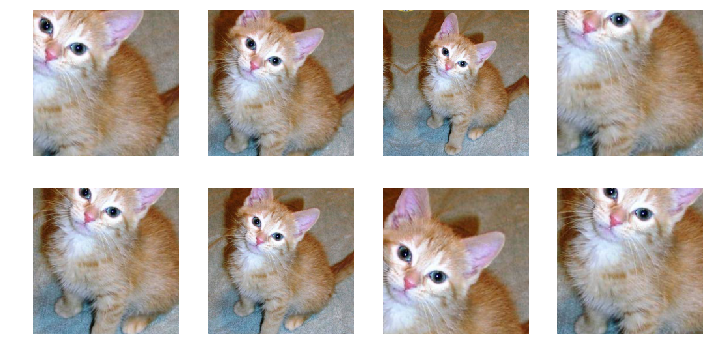

In [ ]:
tfms = zoom_crop(scale=(0.75,2), do_rand=True)
plots_f(2, 4, 12, 6, size=224)

In [ ]:
show_doc(rand_resize_crop, ignore_warn=True, arg_comments={
    'size': 'Final size of the image',
    'max_scale': 'Zooms the image to a random scale up to this',
    'ratios': 'Range of ratios in which a new one will be randomly picked'
})

<h4 id="rand_resize_crop" class="doc_header"><code>rand_resize_crop</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L347" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#rand_resize_crop-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>rand_resize_crop</code>(**`size`**:`int`, **`max_scale`**:`float`=***`2.0`***, **`ratios`**:`Point`=***`(0.75, 1.33)`***)

<div class="collapse" id="rand_resize_crop-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#rand_resize_crop-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>rand_resize_crop</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

Randomly resize and crop the image to a ratio in `ratios` after a zoom of `max_scale`. 

- *size*: Final size of the image
- *max_scale*: Zooms the image to a random scale up to this
- *ratios*: Range of ratios in which a new one will be randomly picked 

Esta transformação é uma implementação da principal abordagem usada para quase todas as entradas IMAGEnet vencedoras desde 2013, com base em [Some Improvements on Deep Convolutional Neural Network Based Image Classification](https://arxiv.org/abs/1312.5402) de Andrew Howard. Ela determina uma nova largura e altura da imagem após a escala aleatória e esguicho para a nova relação são aplicados. Aqueles são comutados com uma probabilidade de 0,5. Em seguida, voltar a parte da imagem, com a largura e altura calculado, centrado no `row_pct`,` col_pct` se a largura e a altura são ambos menores do que o tamanho correspondente da imagem. Caso contrário, tente novamente com novos parâmetros aleatórios.

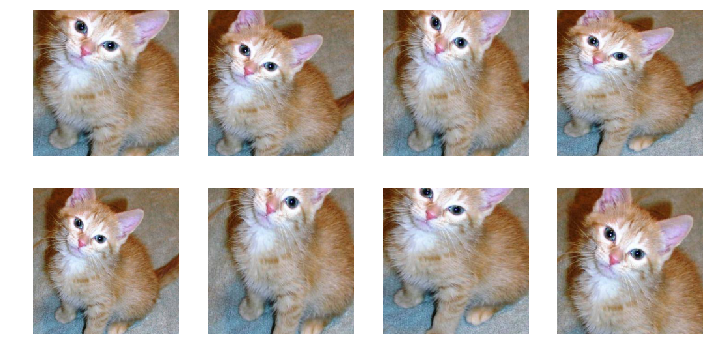

In [ ]:
tfms = [rand_resize_crop(224)]
plots_f(2, 4, 12, 6, size=224)

## Aleatoriedade

As funções que definem transformar cada, tais como [`rotate`](/vision.transform.html#_rotate)or [`flip_lr`](/vision.transform.html#_flip_lr) são deterministas. A biblioteca fastai então embaralhar-los de duas maneiras diferentes:
- transformar cada um pode ser definido com um argumento chamado `p` representando a probabilidade de que ela seja aplicada
- cada argumento de que é o tipo-anotado com uma função aleatória (como [`uniform`](/torch_core.html#uniform) ou [<code>rand_bool</code>](http://docs.fast.ai/vision.image.html#rand_bool)) pode ser substituída por uma tupla de argumentos aceitos por esta função, e em cada chamada da transformação, o argumento que é passado dentro da função será escolhido aleatoriamente usando essa função aleatória.
Se olharmos para o [`rotate`](/vision.transform.html#_rotate) função, por exemplo, vemos que tem um argumento `degrees` que é tipo-anotado como uniforme.
** Primeiro nível de aleatoriedade: ** Nós podemos definir uma transformação usando [`rotate`](/vision.transform.html#_rotate) com `degrees` fixo para um valor, mas pela passagem de um argumento` p`. A rotação será então executado com uma probabilidade de `p` mas sempre com o mesmo valor de` degrees`.

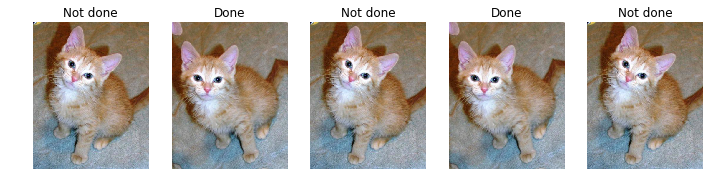

In [ ]:
tfm = [rotate(degrees=30, p=0.5)]
fig, axs = plt.subplots(1,5,figsize=(12,4))
for ax in axs:
    img = get_ex().apply_tfms(tfm)
    title = 'Done' if tfm[0].do_run else 'Not done'
    img.show(ax=ax, title=title)

** Segundo nível de aleatoriedade **: Podemos definir uma transformação usando [`rotate`](/vision.transform.html#_rotate) com `degrees` definidos como um intervalo, sem um argumento` p`. A rotação será então sempre ser executados com um valor aleatório escolhido uniformemente entre os dois carros alegóricos que colocamos em `degrees`.

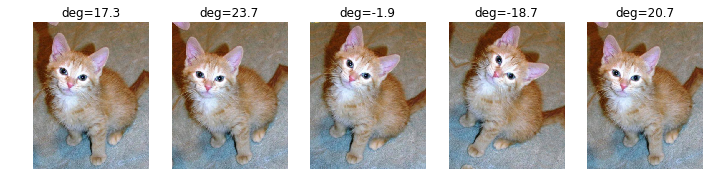

In [ ]:
tfm = [rotate(degrees=(-30,30))]
fig, axs = plt.subplots(1,5,figsize=(12,4))
for ax in axs:
    img = get_ex().apply_tfms(tfm)
    title = f"deg={tfm[0].resolved['degrees']:.1f}"
    img.show(ax=ax, title=title)

** Todas combinado **: Podemos definir uma transformação usando [`rotate`](/vision.transform.html#_rotate) com `degrees` definido como um intervalo, e um argumento` p`. A rotação irá então ser executado com uma probabilidade p` `e com um valor aleatório escolhido uniformemente entre os dois flutuadores que colocamos na` degrees`.

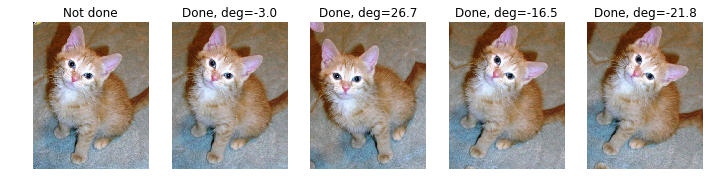

In [ ]:
tfm = [rotate(degrees=(-30,30), p=0.75)]
fig, axs = plt.subplots(1,5,figsize=(12,4))
for ax in axs:
    img = get_ex().apply_tfms(tfm)
    title = f"Done, deg={tfm[0].resolved['degrees']:.1f}" if tfm[0].do_run else f'Not done'
    img.show(ax=ax, title=title)

## Lista de transformações

Aqui está a lista de todas as funções deterministas em que as transformações são construídas. Como explicado anteriormente, cada um deles pode ter uma probabilidade `p` de ser executado, ea qualquer momento um argumento é do tipo-anotado com uma função aleatória, é possível embaralhar-lo através dessa função.

In [ ]:
show_doc(brightness)

<h4 id="_brightness" class="doc_header"><code>brightness</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L15" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_brightness-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>brightness</code>(**`x`**, **`change`**:[`uniform`](/torch_core.html#uniform)) → [`Image`](/vision.image.html#Image) :: [`TfmLighting`](/vision.image.html#TfmLighting)

<div class="collapse" id="_brightness-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_brightness-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>brightness</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

Apply `change` in brightness of image `x`.  

Este transformar ajusta o brilho da imagem dependendo do valor de `change`. Um `change` de 0 irá transformar a imagem a preto, e um` change` de 1 irá transformar a imagem para o branco. `Change` = 0,5 não ajustar o brilho.

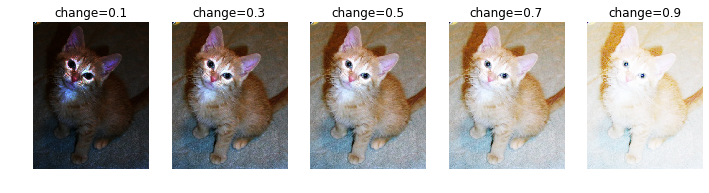

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for change, ax in zip(np.linspace(0.1,0.9,5), axs):
    brightness(get_ex(), change).show(ax=ax, title=f'change={change:.1f}')

In [ ]:
show_doc(contrast)

<h4 id="_contrast" class="doc_header"><code>contrast</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L20" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_contrast-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>contrast</code>(**`x`**, **`scale`**:[`log_uniform`](/torch_core.html#log_uniform)) → [`Image`](/vision.image.html#Image) :: [`TfmLighting`](/vision.image.html#TfmLighting)

<div class="collapse" id="_contrast-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_contrast-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>contrast</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

Apply `scale` to contrast of image `x`.  

`Scale` ajusta o contraste. A `scale` de 0 irá transformar a imagem para cinza, e um` scale` mais de 1 irá transformar a imagem de super-contraste. `Scale` = 1. não ajustar o contraste.

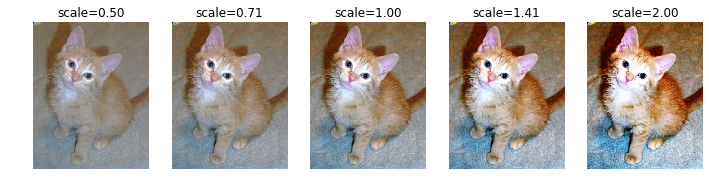

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for scale, ax in zip(np.exp(np.linspace(log(0.5),log(2),5)), axs):
    contrast(get_ex(), scale).show(ax=ax, title=f'scale={scale:.2f}')

In [ ]:
show_doc(crop)

<h4 id="_crop" class="doc_header"><code>crop</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L169" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_crop-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>crop</code>(**`x`**, **`size`**, **`row_pct`**:[`uniform`](/torch_core.html#uniform)=***`0.5`***, **`col_pct`**:[`uniform`](/torch_core.html#uniform)=***`0.5`***) → [`Image`](/vision.image.html#Image) :: [`TfmPixel`](/vision.image.html#TfmPixel)

<div class="collapse" id="_crop-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_crop-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>Tests found for <code>crop</code>:</p><ul><li><code>pytest -sv tests/test_vision_transform.py::test_crop_without_size</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L123" class="source_link" style="float:right">[source]</a></li><li><code>pytest -sv tests/test_vision_transform.py::test_crops_with_tensor_image_sizes</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L131" class="source_link" style="float:right">[source]</a></li><li><code>pytest -sv tests/test_vision_transform.py::test_deterministic_transforms</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L111" class="source_link" style="float:right">[source]</a></li></ul><p>To run tests please refer to this <a href="/dev/test.html#quick-guide">guide</a>.</p></div></div>

Este transformar leva uma cultura da imagem voltar um de dimensão dada. A posição é dada por `(col_pct, row_pct)`, com `` col_pct` e row_pct` sendo normalizada entre 0. 1 e.

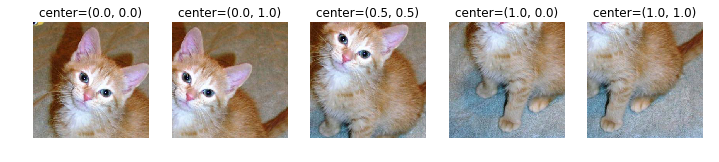

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for center, ax in zip([[0.,0.], [0.,1.],[0.5,0.5],[1.,0.], [1.,1.]], axs):
    crop(get_ex(), 300, *center).show(ax=ax, title=f'center=({center[0]}, {center[1]})')

In [ ]:
show_doc(crop_pad, ignore_warn=True, arg_comments={
    'x': 'Image to transform',
    'size': "Size of the crop, if it's an int, the crop will be square",
    'padding_mode': "How to pad the output image ('zeros', 'border' or 'reflection')",
    'row_pct': 'Between 0. and 1., position of the center on the y axis (0. is top, 1. is bottom, 0.5 is center)',
    'col_pct': 'Between 0. and 1., position of the center on the x axis (0. is left, 1. is right, 0.5 is center)'
})

<h4 id="_crop_pad" class="doc_header"><code>crop_pad</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L200" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_crop_pad-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>crop_pad</code>(**`x`**, **`size`**, **`padding_mode`**=***`'reflection'`***, **`row_pct`**:[`uniform`](/torch_core.html#uniform)=***`0.5`***, **`col_pct`**:[`uniform`](/torch_core.html#uniform)=***`0.5`***) → [`Image`](/vision.image.html#Image) :: [`TfmCrop`](/vision.image.html#TfmCrop)

<div class="collapse" id="_crop_pad-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_crop_pad-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>crop_pad</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

 

- *x*: Image to transform
- *size*: Size of the crop, if it's an int, the crop will be square
- *padding_mode*: How to pad the output image ('zeros', 'border' or 'reflection')
- *row_pct*: Between 0. and 1., position of the center on the y axis (0. is top, 1. is bottom, 0.5 is center)
- *col_pct*: Between 0. and 1., position of the center on the x axis (0. is left, 1. is right, 0.5 is center) 

Isso funciona como [`crop`](/vision.transform.html#_crop) mas se o tamanho de destino é maior do que o tamanho da imagem (em qualquer dimensão), o preenchimento é aplicado de acordo com `padding_mode` (veja [`pad`](/vision.transform.html#_pad) para um exemplo de todas as opções) e a posição do centro é ignorado em essa dimensão.

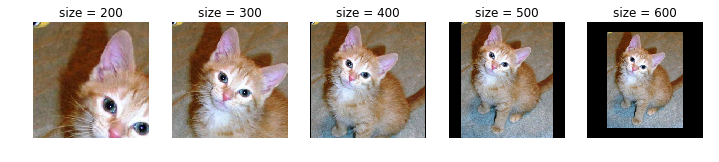

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for size, ax in zip(np.linspace(200,600,5), axs):
    crop_pad(get_ex(), int(size), 'zeros', 0.,0.).show(ax=ax, title=f'size = {int(size)}')

In [ ]:
show_doc(dihedral)

<h4 id="_dihedral" class="doc_header"><code>dihedral</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L79" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_dihedral-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>dihedral</code>(**`x`**, **`k`**:<code>partial(</code>[`uniform_int`](/torch_core.html#uniform_int), `0`, `7`<code>)</code>) → [`Image`](/vision.image.html#Image) :: [`TfmPixel`](/vision.image.html#TfmPixel)

<div class="collapse" id="_dihedral-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_dihedral-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>Tests found for <code>dihedral</code>:</p><ul><li><code>pytest -sv tests/test_vision_transform.py::test_all_dihedral</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L102" class="source_link" style="float:right">[source]</a></li></ul><p>To run tests please refer to this <a href="/dev/test.html#quick-guide">guide</a>.</p></div></div>

Randomly flip `x` image based on `k`.  

Isto aplica-se transformar combina uma aleta (horizontal ou vertical) e uma rotação de um múltiplo de 90 graus.

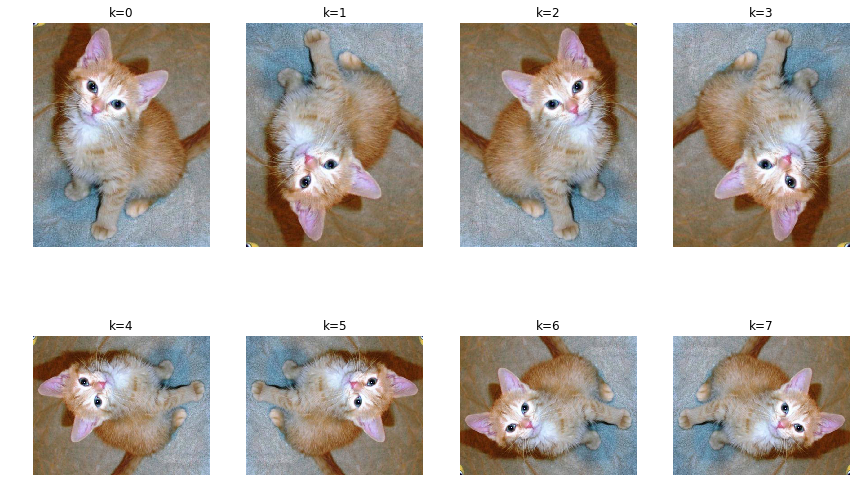

In [ ]:
fig, axs = plt.subplots(2,4,figsize=(12,8))
for k, ax in enumerate(axs.flatten()):
    dihedral(get_ex(), k).show(ax=ax, title=f'k={k}')
plt.tight_layout()

In [ ]:
show_doc(dihedral_affine)

<h4 id="_dihedral_affine" class="doc_header"><code>dihedral_affine</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L89" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_dihedral_affine-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>dihedral_affine</code>(**`k`**:<code>partial(</code>[`uniform_int`](/torch_core.html#uniform_int), `0`, `7`<code>)</code>) → [`Image`](/vision.image.html#Image) :: [`TfmAffine`](/vision.image.html#TfmAffine)

<div class="collapse" id="_dihedral_affine-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_dihedral_affine-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>dihedral_affine</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

Randomly flip `x` image based on `k`.  

Esta é uma implementação afim de [`dihedral`](/vision.transform.html#_dihedral) que deve ser usado se o destino for um [`ImagePoints`](/vision.image.html#ImagePoints) ou um [`ImageBBox`](/vision.image.html#ImageBBox).

In [ ]:
show_doc(flip_lr)

<h4 id="_flip_lr" class="doc_header"><code>flip_lr</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L63" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_flip_lr-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>flip_lr</code>(**`x`**) → [`Image`](/vision.image.html#Image) :: [`TfmPixel`](/vision.image.html#TfmPixel)

<div class="collapse" id="_flip_lr-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_flip_lr-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>Tests found for <code>flip_lr</code>:</p><ul><li><code>pytest -sv tests/test_vision_transform.py::test_deterministic_transforms</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L111" class="source_link" style="float:right">[source]</a></li></ul><p>To run tests please refer to this <a href="/dev/test.html#quick-guide">guide</a>.</p></div></div>

Flip `x` horizontally.  

Este transformar horizontalmente vira a imagem. [`flip_lr`](/vision.transform.html#_flip_lr) espelha a imagem.

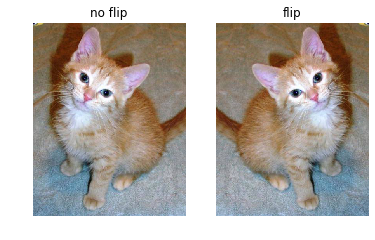

In [ ]:
fig, axs = plt.subplots(1,2,figsize=(6,4))
get_ex().show(ax=axs[0], title=f'no flip')
flip_lr(get_ex()).show(ax=axs[1], title=f'flip')

In [ ]:
show_doc(flip_affine)

<h4 id="_flip_affine" class="doc_header"><code>flip_affine</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L72" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_flip_affine-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>flip_affine</code>() → [`Image`](/vision.image.html#Image) :: [`TfmAffine`](/vision.image.html#TfmAffine)

<div class="collapse" id="_flip_affine-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_flip_affine-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>Tests found for <code>flip_affine</code>:</p><ul><li><code>pytest -sv tests/test_vision_transform.py::test_deterministic_transforms</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L111" class="source_link" style="float:right">[source]</a></li></ul><p>To run tests please refer to this <a href="/dev/test.html#quick-guide">guide</a>.</p></div></div>

Flip `x` horizontally.  

Esta é uma implementação afim de [`flip_lr`](/vision.transform.html#_flip_lr) que deve ser usado se o destino for um [`ImagePoints`](/vision.image.html#ImagePoints) ou um [`ImageBBox`](/vision.image.html#ImageBBox).

In [ ]:
show_doc(jitter, doc_string=False)

<h4 id="_jitter" class="doc_header"><code>jitter</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L57" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_jitter-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>jitter</code>(**`c`**, **`magnitude`**:[`uniform`](/torch_core.html#uniform)) → [`Image`](/vision.image.html#Image) :: [`TfmCoord`](/vision.image.html#TfmCoord)

<div class="collapse" id="_jitter-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_jitter-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>jitter</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

Esta transformada alterações os pixels da imagem, substituindo-os com aleatoriamente pixels da vizinhança (em que medida a vizinhança estende é controlado pelo valor do `magnitude`).

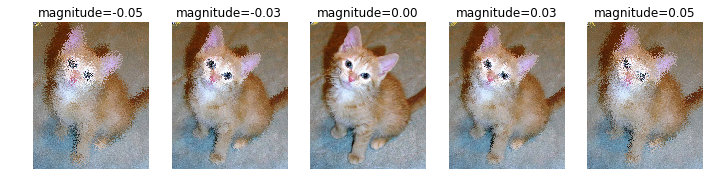

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for magnitude, ax in zip(np.linspace(-0.05,0.05,5), axs):
    tfm = jitter(magnitude=magnitude)
    get_ex().jitter(magnitude).show(ax=ax, title=f'magnitude={magnitude:.2f}')

In [ ]:
show_doc(pad)

<h4 id="_pad" class="doc_header"><code>pad</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L116" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_pad-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>pad</code>(**`x`**, **`padding`**:`int`, **`mode`**=***`'reflection'`***) → [`Image`](/vision.image.html#Image) :: [`TfmPixel`](/vision.image.html#TfmPixel)

<div class="collapse" id="_pad-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_pad-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>Tests found for <code>pad</code>:</p><ul><li><code>pytest -sv tests/test_vision_transform.py::test_deterministic_transforms</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L111" class="source_link" style="float:right">[source]</a></li></ul><p>To run tests please refer to this <a href="/dev/test.html#quick-guide">guide</a>.</p></div></div>

Pad a imagem de pixel, adicionando `padding` em cada lado do quadro de acordo com a` mode`:
- `modo = 'zeros'`: almofadas com zeros,
- `mode = 'border'`: repete os pixels na fronteira.
- `mode = 'reflection'`: almofadas, tomando as simétrica pixels para a fronteira.

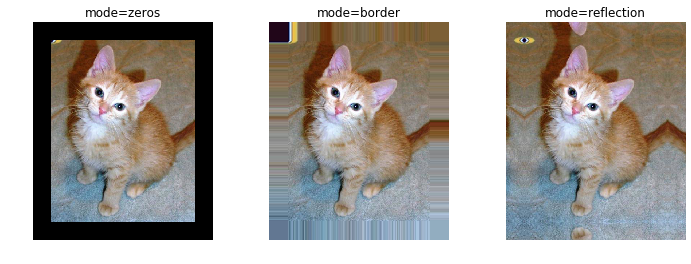

In [ ]:
fig, axs = plt.subplots(1,3,figsize=(12,4))
for mode, ax in zip(['zeros', 'border', 'reflection'], axs):
    pad(get_ex(), 50, mode).show(ax=ax, title=f'mode={mode}')

In [ ]:
show_doc(perspective_warp)

<h4 id="_perspective_warp" class="doc_header"><code>perspective_warp</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L268" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_perspective_warp-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>perspective_warp</code>(**`c`**, **`magnitude`**:<code>partial(</code>[`uniform`](/torch_core.html#uniform), `size=8`<code>)</code>=***`0`***, **`invert`**=***`False`***) → [`Image`](/vision.image.html#Image) :: [`TfmCoord`](/vision.image.html#TfmCoord)

<div class="collapse" id="_perspective_warp-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_perspective_warp-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>Tests found for <code>perspective_warp</code>:</p><ul><li><code>pytest -sv tests/test_vision_transform.py::test_all_warps</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L83" class="source_link" style="float:right">[source]</a></li></ul><p>To run tests please refer to this <a href="/dev/test.html#quick-guide">guide</a>.</p></div></div>

Apply warp of `magnitude` to `c`.  

Perspectiva deformação é uma deformação da imagem como visto num plano diferente do 3D-plano. O novo plano é determinada por contar onde quer que cada um dos quatro cantos da imagem (entre -1 e 1, -1 sendo deixado / topo, sendo um para a direita / fundo).

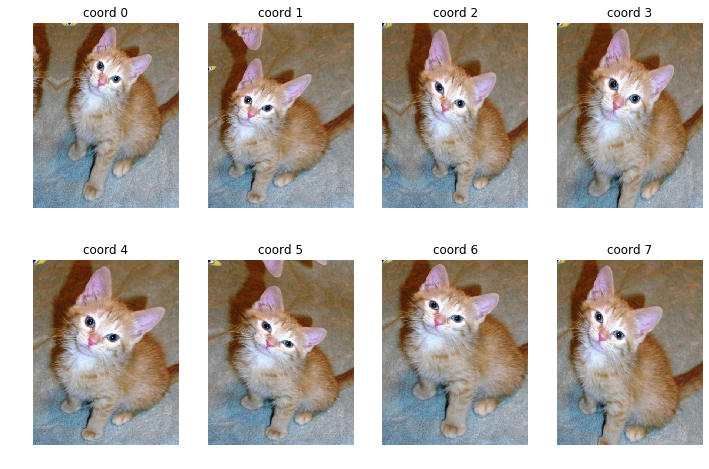

In [ ]:
fig, axs = plt.subplots(2,4,figsize=(12,8))
for i, ax in enumerate(axs.flatten()):
    magnitudes = torch.tensor(np.zeros(8))
    magnitudes[i] = 0.5
    perspective_warp(get_ex(), magnitudes).show(ax=ax, title=f'coord {i}')

#### redimensionar
de Pytorch `transforms.Resize (tamanho)` equivalente é implementado sem uma função de transformação explícita na fastai. É feito através dos argumentos `size` e` resize_method`.
O argumento `size` pode ser uma única` `int` 224`, ou um tuplo de int`s` `` (224,400). O comportamento padrão é para cortar a imagem de um quadrado quando um único `int` é passado e para esmagar-lo no caso de um` tuple`, de modo que:
* Se tamanho = 224 é passado, ele irá redimensionar e recortar a (224,224)
* Se tamanho = (224400) é transmitido, ele vai esmagar-a (224,400)
* Se size = (224.224) é aprovada, ele irá esmagar (não cortar!) Para (224,224)
Você pode substituir o [`resize_method`](vision.image.html#ResizeMethod) padrão.
Nota:
Se você receber um erro semelhante ao abaixo:
```
RuntimeError: Argument #4: Padding size should be less than the corresponding input dimension, but got: padding (46, 46) at dimension 3 of input [1, 3, 128, 36]
```
isso é causado por um problema com estofamento reflexão de PyTorch, que a biblioteca utiliza por padrão. Adicionando um argumento palavra-chave adicional `padding_mode = 'zeros'` deve ser capaz de servir como uma solução alternativa para agora.
O redimensionamento é realizada de forma ligeiramente diferente, dependendo de como [`ImageDataBunch`](/vision.data.html#ImageDataBunch) é criado:
1. Quando o atalho [`ImageDataBunch`](/vision.data.html#ImageDataBunch) `From_ *` métodos são usados, a `` size` e argumentos resize_method` são passados ​​com o resto dos argumentos. Por exemplo, para redimensionar imagens em tempo real para `224x224` com` método from_name_re`, fazer:
```
Dados = ImageDataBunch.from_name_re (path_img, fnames, pat, tamanho = 224, bs = bs)
```
e para substituir a `resize_method`:
```
Dados = ImageDataBunch.from_name_re (path_img, fnames, pat, tamanho = 224, resize_method = ResizeMethod.SQUISH, bs = bs)
```
2. Quando [data block API](/data_block.html) é usado, o size` `e` resize_method` são passados ​​através do método [`transform`](/vision.transform.html#vision.transform). Por exemplo:
```
src = ImageList.from_folder (caminho) .split_none (). label_from_folder ()
MFT = get_transforms () # ou MFT = None se nenhum são necessários
tamanho = 224 # tamanho = (224224) ou (400,224)
Dados = src.transform (MFT = MFT, tamanho = tamanho, resize_method = ResizeMethod.SQUISH) .databunch (bs = bs, num_workers = 4) .normalize ()
```
** O redimensionamento antes do treino **
Note que se você apenas deseja redimensionar as imagens de entrada, fazê-lo em tempo real via transformar é ineficiente, uma vez que terá de ser feito em cada notebook re-run. As chances são de que você vai querer redimensionar as imagens no sistema de arquivos e usar os conjuntos de dados redimensionadas conforme necessário.
Por exemplo, você poderia usar o código fastai para fazer isso, para criar imagens de baixa resolução em 'small-96', e no meio da resolução de imagens sob `small-256`:
```
from fastai.vision import *

path = untar_data(URLs.PETS)
path_hr = path/'images'
path_lr = path/'small-96'
path_mr = path/'small-256'

il = ImageList.from_folder(path_hr)

def resize_one(fn, i, path, size):
    dest = path/fn.relative_to(path_hr)
    dest.parent.mkdir(parents=True, exist_ok=True)
    img = PIL.Image.open(fn)
    targ_sz = resize_to(img, size, use_min=True)
    img = img.resize(targ_sz, resample=PIL.Image.BILINEAR).convert('RGB')
    img.save(dest, quality=75)
    
# create smaller image sets the first time this nb is run
sets = [(path_lr, 96), (path_mr, 256)]
for p,size in sets:
    if not p.exists(): 
        print(f"resizing to {size} into {p}")
        parallel(partial(resize_one, path=p, size=size), il.items)    
```
Claro, ajustar `quality`,` resample`, e outros argumentos para atender às suas necessidades. Você também precisará ajustá-lo para diretórios personalizados ([`train`](/train.html#train), `test`, etc.)
[imagemagick](https://www.imagemagick.org/) do `mogrify` e` convert` são ferramentas comumente usado para redimensionar imagens através do seu shell. Por exemplo, se você estiver em um diretório [`data`](/vision.data.html#vision.data), contendo um diretório `test`:
```
ls -1 *
test
```
e você quer criar um novo diretório `300x224 / test` com imagens redimensionadas para` 300x224`:
```
SRC=train; DEST=300x224; mkdir -p $DEST/$SRC; find $SRC -name "*.jpg" -exec convert -resize 300x224 -gravity center -extent 300x224 {} $DEST/{} \;
```
Verifique a documentação do imagemagick para os muitos várias opções.
Se você já tem um diretório que é uma cópia de imagens originais, `mogrify` é geralmente aplicado diretamente para os arquivos com o mesmo resultado:
```
mkdir 300x224
cp -r train 300x224
cd 300x224/train
mogrify -resize 300x224 -gravity center -extent 300x224 *jpg
```

In [ ]:
jekyll_note("""In fastai we follow the convention of numpy and pytorch for image dimensions: (height, width). It's different
            from PIL or matplotlib, so don't get confused. Passing size=(300,200) for instance will give you a height of 300
            and a width of 200.""")

<div markdown="span" class="alert alert-info" role="alert"><i class="fa fa-info-circle"></i> <b>Note: </b>In fastai we follow the convention of numpy and pytorch for image dimensions: (height, width). It's different
            from PIL or matplotlib, so don't get confused. Passing size=(300,200) for instance will give you a height of 300
            and a width of 200.</div>

In [ ]:
show_doc(rotate)

<h4 id="_rotate" class="doc_header"><code>rotate</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L25" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_rotate-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>rotate</code>(**`degrees`**:[`uniform`](/torch_core.html#uniform)) → [`Image`](/vision.image.html#Image) :: [`TfmAffine`](/vision.image.html#TfmAffine)

<div class="collapse" id="_rotate-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_rotate-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>Tests found for <code>rotate</code>:</p><ul><li><code>pytest -sv tests/test_vision_transform.py::test_deterministic_transforms</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L111" class="source_link" style="float:right">[source]</a></li></ul><p>To run tests please refer to this <a href="/dev/test.html#quick-guide">guide</a>.</p></div></div>

Rotate image by `degrees`.  

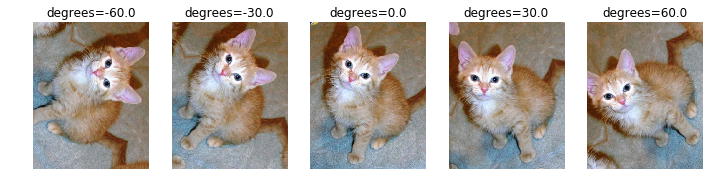

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for deg, ax in zip(np.linspace(-60,60,5), axs):
    get_ex().rotate(degrees=deg).show(ax=ax, title=f'degrees={deg}')

In [ ]:
show_doc(rgb_randomize)

<h4 id="_rgb_randomize" class="doc_header"><code>rgb_randomize</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L137" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_rgb_randomize-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>rgb_randomize</code>(**`x`**, **`channel`**:`int`=***`None`***, **`thresh`**:`float`=***`0.3`***) → [`Image`](/vision.image.html#Image) :: [`TfmPixel`](/vision.image.html#TfmPixel)

<div class="collapse" id="_rgb_randomize-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_rgb_randomize-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>rgb_randomize</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

Randomize one of the channels of the input image  

- _channel_: Qual o canal (RGB) para randomise
- _thresh_: Depois de randomização, escalar os valores para não exceder o valor `thresh`
Randomizando um dos três canais, a [`learner`](/vision.learner.html#vision.learner) essencialmente vê a mesma imagem, mas com cores diferentes. Normalmente, cada imagem RGB tem um canal que é dominante, e randomização este canal é a mais arriscada; Assim, um valor baixo `thresh` (limiar) deve ser aplicado. Neste exemplo, a `channel` _Green_ é o dominante.

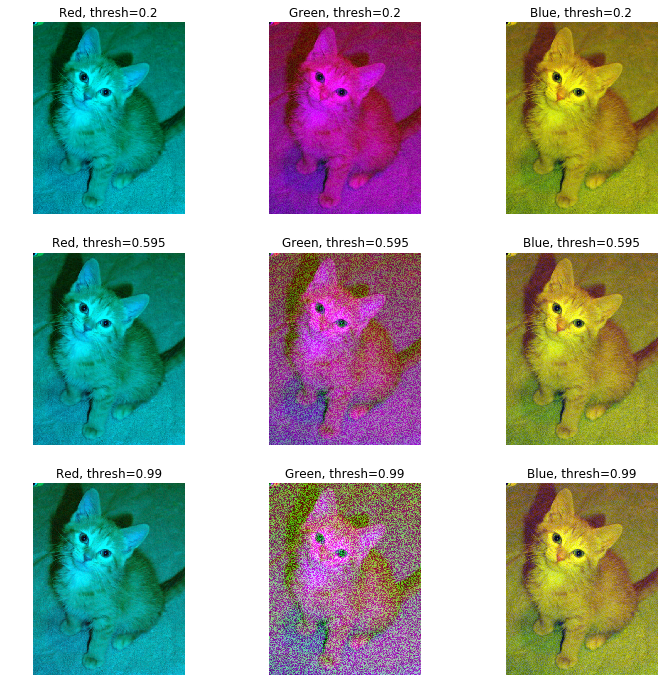

In [ ]:
fig, axs = plt.subplots(3,3,figsize=(12,12))
channels = ['Red', 'Green', 'Blue']

for i in np.arange(0, 3):
    for thresh, ax in zip(np.linspace(0.2, 0.99, 3), axs[:, i]):
        get_ex().rgb_randomize(channel = i, thresh = thresh).show(
            ax=ax, title = f'{channels[i]}, thresh={thresh}')

In [ ]:
show_doc(skew)

<h4 id="_skew" class="doc_header"><code>skew</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L293" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_skew-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>skew</code>(**`c`**, **`direction`**:[`uniform_int`](/torch_core.html#uniform_int), **`magnitude`**:[`uniform`](/torch_core.html#uniform)=***`0`***, **`invert`**=***`False`***) → [`Image`](/vision.image.html#Image) :: [`TfmCoord`](/vision.image.html#TfmCoord)

<div class="collapse" id="_skew-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_skew-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>Tests found for <code>skew</code>:</p><ul><li><code>pytest -sv tests/test_vision_transform.py::test_all_warps</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L83" class="source_link" style="float:right">[source]</a></li></ul><p>To run tests please refer to this <a href="/dev/test.html#quick-guide">guide</a>.</p></div></div>

Skew `c` field with random `direction` and `magnitude`.  

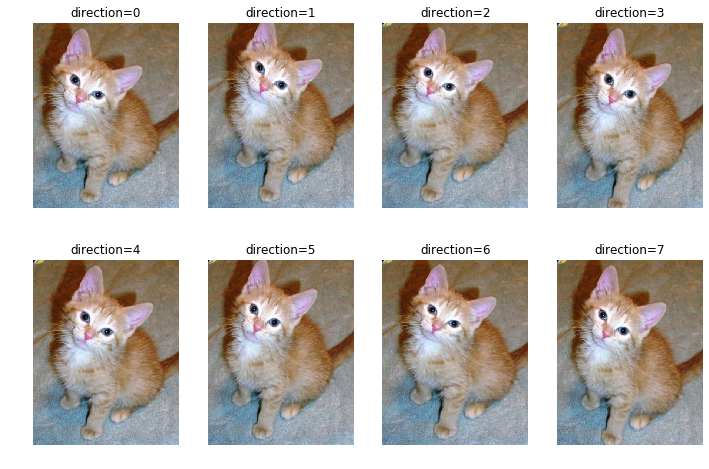

In [ ]:
fig, axs = plt.subplots(2,4,figsize=(12,8))
for i, ax in enumerate(axs.flatten()):
    get_ex().skew(i, 0.2).show(ax=ax, title=f'direction={i}')

In [ ]:
show_doc(squish)

<h4 id="_squish" class="doc_header"><code>squish</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L47" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_squish-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>squish</code>(**`scale`**:[`uniform`](/torch_core.html#uniform)=***`1.0`***, **`row_pct`**:[`uniform`](/torch_core.html#uniform)=***`0.5`***, **`col_pct`**:[`uniform`](/torch_core.html#uniform)=***`0.5`***) → [`Image`](/vision.image.html#Image) :: [`TfmAffine`](/vision.image.html#TfmAffine)

<div class="collapse" id="_squish-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_squish-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>Tests found for <code>squish</code>:</p><ul><li><code>pytest -sv tests/test_vision_transform.py::test_deterministic_transforms</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L111" class="source_link" style="float:right">[source]</a></li></ul><p>To run tests please refer to this <a href="/dev/test.html#quick-guide">guide</a>.</p></div></div>

Squish image by `scale`. `row_pct`,`col_pct` select focal point of zoom.  

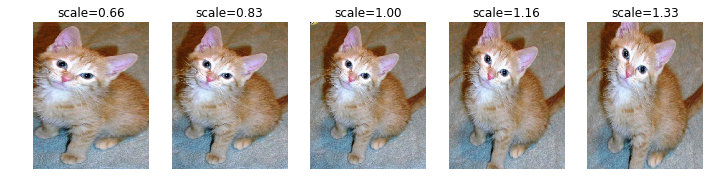

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for scale, ax in zip(np.linspace(0.66,1.33,5), axs):
    get_ex().squish(scale=scale).show(ax=ax, title=f'scale={scale:.2f}')

In [ ]:
show_doc(symmetric_warp)

<h4 id="_symmetric_warp" class="doc_header"><code>symmetric_warp</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L275" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_symmetric_warp-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>symmetric_warp</code>(**`c`**, **`magnitude`**:<code>partial(</code>[`uniform`](/torch_core.html#uniform), `size=4`<code>)</code>=***`0`***, **`invert`**=***`False`***) → [`Image`](/vision.image.html#Image) :: [`TfmCoord`](/vision.image.html#TfmCoord)

<div class="collapse" id="_symmetric_warp-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_symmetric_warp-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>symmetric_warp</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

Apply symmetric warp of `magnitude` to `c`.  

Aplicar os quatro inclinações, ao mesmo tempo, cada um com uma força dada no vector magnitude` `. Veja [`tilt`](/vision.transform.html#_tilt) logo abaixo para o efeito de cada inclinação individual.

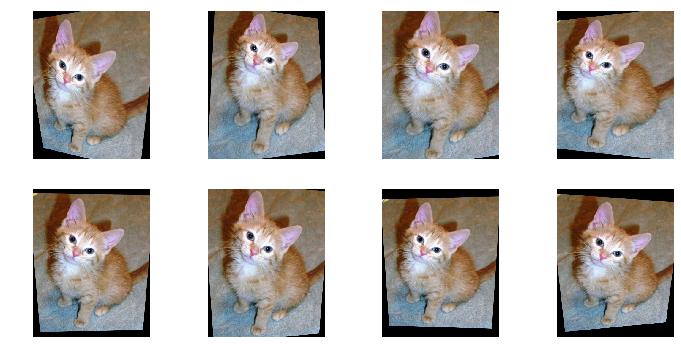

In [ ]:
tfm = symmetric_warp(magnitude=(-0.2,0.2))
_, axs = plt.subplots(2,4,figsize=(12,6))
for ax in axs.flatten():
    img = get_ex().apply_tfms(tfm, padding_mode='zeros')
    img.show(ax=ax)

In [ ]:
show_doc(tilt)

<h4 id="_tilt" class="doc_header"><code>tilt</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L282" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_tilt-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>tilt</code>(**`c`**, **`direction`**:[`uniform_int`](/torch_core.html#uniform_int), **`magnitude`**:[`uniform`](/torch_core.html#uniform)=***`0`***, **`invert`**=***`False`***) → [`Image`](/vision.image.html#Image) :: [`TfmCoord`](/vision.image.html#TfmCoord)

<div class="collapse" id="_tilt-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_tilt-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>Tests found for <code>tilt</code>:</p><ul><li><code>pytest -sv tests/test_vision_transform.py::test_all_warps</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L83" class="source_link" style="float:right">[source]</a></li></ul><p>To run tests please refer to this <a href="/dev/test.html#quick-guide">guide</a>.</p></div></div>

Tilt `c` field with random `direction` and `magnitude`.  

`Direction` é um número (0: esquerda, 1: direita, 2: topo, 3: inferior). Um `magnitude` positivo é uma inclinação para a frente (para a pessoa que olha para a imagem), um negativo` magnitude` uma inclinação para trás.

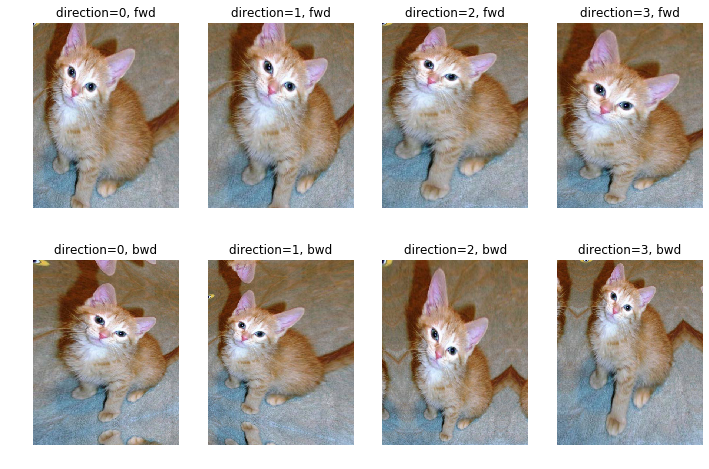

In [ ]:
fig, axs = plt.subplots(2,4,figsize=(12,8))
for i in range(4):
    get_ex().tilt(i, 0.4).show(ax=axs[0,i], title=f'direction={i}, fwd')
    get_ex().tilt(i, -0.4).show(ax=axs[1,i], title=f'direction={i}, bwd')

In [ ]:
show_doc(zoom)

<h4 id="_zoom" class="doc_header"><code>zoom</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L39" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_zoom-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>zoom</code>(**`scale`**:[`uniform`](/torch_core.html#uniform)=***`1.0`***, **`row_pct`**:[`uniform`](/torch_core.html#uniform)=***`0.5`***, **`col_pct`**:[`uniform`](/torch_core.html#uniform)=***`0.5`***) → [`Image`](/vision.image.html#Image) :: [`TfmAffine`](/vision.image.html#TfmAffine)

<div class="collapse" id="_zoom-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_zoom-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>Tests found for <code>zoom</code>:</p><ul><li><code>pytest -sv tests/test_vision_transform.py::test_deterministic_transforms</code> <a href="https://github.com/fastai/fastai/blob/master/tests/test_vision_transform.py#L111" class="source_link" style="float:right">[source]</a></li></ul><p>To run tests please refer to this <a href="/dev/test.html#quick-guide">guide</a>.</p></div></div>

Zoom image by `scale`. `row_pct`,`col_pct` select focal point of zoom.  

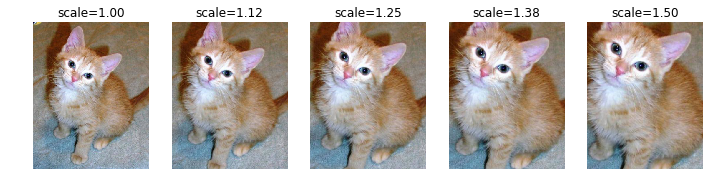

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for scale, ax in zip(np.linspace(1., 1.5,5), axs):
    get_ex().zoom(scale=scale).show(ax=ax, title=f'scale={scale:.2f}')

In [ ]:
show_doc(cutout)

<h4 id="_cutout" class="doc_header"><code>cutout</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L122" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#_cutout-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>cutout</code>(**`x`**, **`n_holes`**:[`uniform_int`](/torch_core.html#uniform_int)=***`1`***, **`length`**:[`uniform_int`](/torch_core.html#uniform_int)=***`40`***) → [`Image`](/vision.image.html#Image) :: [`TfmPixel`](/vision.image.html#TfmPixel)

<div class="collapse" id="_cutout-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#_cutout-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>cutout</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

Cut out `n_holes` number of square holes of size `length` in image at random locations.  

A técnica de normalização descrito no presente documento: [Improved Regularization of Convolutional Neural Networks with Cutout](https://arxiv.org/pdf/1708.04552.pdf)
Por defeito, que vai aplicar um único entalhe ( `n_holes = 1`) de comprimento =` 40`) com uma probabilidade de p = `1`. A posição recorte é sempre aleatória. Se você optar por fazer vários cortes, eles podem se sobrepor.
O papel acima recortes utilizados de tamanho 16x16 para Cifar-10 (classificação de 10 categorias) e recortes de tamanho 8x8 para Cifar-100 (100 categorias). Geralmente, quanto mais categorias, a menos recorte que você quer.

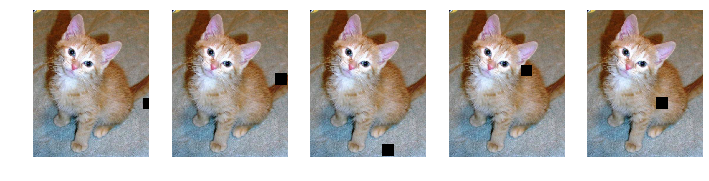

In [ ]:
tfms = [cutout()]
fig, axs = plt.subplots(1,5,figsize=(12,4))
for ax in axs:
    get_ex().apply_tfms(tfms).show(ax=ax)

Você pode adicionar um pouco de aleatoriedade para os recortes como este:

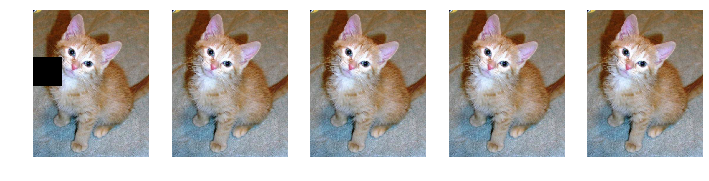

In [ ]:
tfms = [cutout(n_holes=(1,4), length=(10, 160), p=.5)]
fig, axs = plt.subplots(1,5,figsize=(12,4))
for ax in axs:
    get_ex().apply_tfms(tfms).show(ax=ax)

## funções de conveniência

Estas funções simplificar a criação de versões aleatórios de [`crop_pad`](/vision.transform.html#_crop_pad) e [`zoom`](/vision.transform.html#_zoom).

In [ ]:
show_doc(rand_crop)

<h4 id="rand_crop" class="doc_header"><code>rand_crop</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L222" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#rand_crop-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>rand_crop</code>(**\*`args`**, **`padding_mode`**=***`'reflection'`***, **`p`**:`float`=***`1.0`***)

<div class="collapse" id="rand_crop-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#rand_crop-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>rand_crop</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

Randomized version of [`crop_pad`](/vision.transform.html#_crop_pad).  

Os `args` são para fins internos e não deve ser tocado.

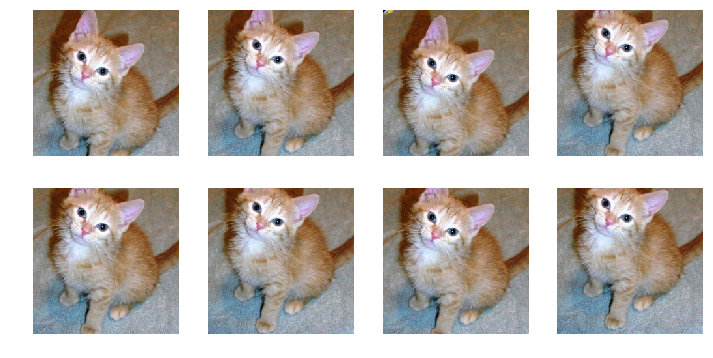

In [ ]:
tfm = rand_crop()
_, axs = plt.subplots(2,4,figsize=(12,6))
for ax in axs.flatten():
    img = get_ex().apply_tfms(tfm, size=224)
    img.show(ax=ax)

In [ ]:
show_doc(rand_pad)

<h4 id="rand_pad" class="doc_header"><code>rand_pad</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L213" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#rand_pad-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>rand_pad</code>(**`padding`**:`int`, **`size`**:`int`, **`mode`**:`str`=***`'reflection'`***)

<div class="collapse" id="rand_pad-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#rand_pad-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>rand_pad</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

Fixed `mode` `padding` and random crop of `size`  

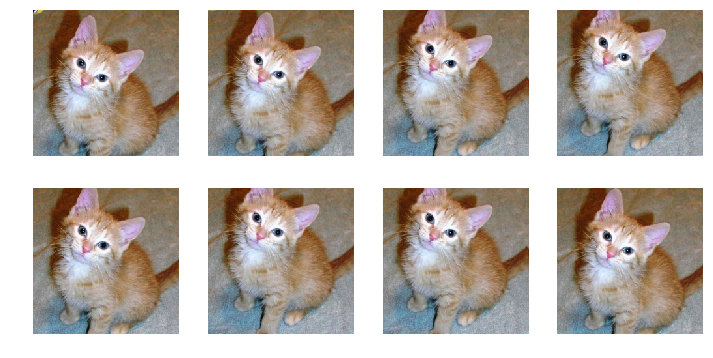

In [ ]:
tfm = rand_pad(4, 224)
_, axs = plt.subplots(2,4,figsize=(12,6))
for ax in axs.flatten():
    img = get_ex().apply_tfms(tfm, size=224)
    img.show(ax=ax)

In [ ]:
show_doc(rand_zoom)

<h4 id="rand_zoom" class="doc_header"><code>rand_zoom</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L218" class="source_link" style="float:right">[source]</a><a class="source_link" data-toggle="collapse" data-target="#rand_zoom-pytest" style="float:right; padding-right:10px">[test]</a></h4>

> <code>rand_zoom</code>(**`scale`**:[`uniform`](/torch_core.html#uniform)=***`1.0`***, **`p`**:`float`=***`1.0`***)

<div class="collapse" id="rand_zoom-pytest"><div class="card card-body pytest_card"><a type="button" data-toggle="collapse" data-target="#rand_zoom-pytest" class="close" aria-label="Close"><span aria-hidden="true">&times;</span></a><p>No tests found for <code>rand_zoom</code>. To contribute a test please refer to <a href="/dev/test.html">this guide</a> and <a href="https://forums.fast.ai/t/improving-expanding-functional-tests/32929">this discussion</a>.</p></div></div>

Randomized version of [`zoom`](/vision.transform.html#_zoom).  

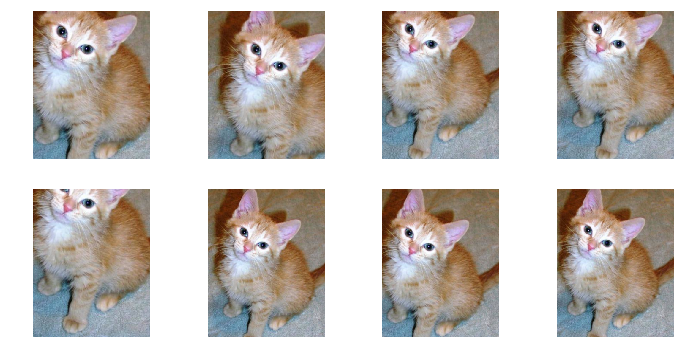

In [ ]:
tfm = rand_zoom(scale=(1.,1.5))
_, axs = plt.subplots(2,4,figsize=(12,6))
for ax in axs.flatten():
    img = get_ex().apply_tfms(tfm)
    img.show(ax=ax)

## Indocumentados Métodos - Métodos movidos abaixo desta linha irá intencionalmente ser escondido

## Novos Métodos - Por favor, documento ou mover para a seção em situação irregular